# Setup

As part of the April fun, I decided to add some fun narration, please don't mark me down on this...

In [3]:
import cv2
from matplotlib import pyplot as plt

# This is a bit of magic to make matplotlib figures appear inline in the notebook
# rather than in a new window.
%matplotlib inline
plt.rcParams['figure.figsize'] = (100.0, 80.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'


def show_img(img):
    img = cv2.imread(img,-1)
    plt.subplot(131),plt.imshow(img),
    plt.title('Color'),plt.xticks([]), plt.yticks([])
    plt.show()

# Task 1: Observing HTTP Request

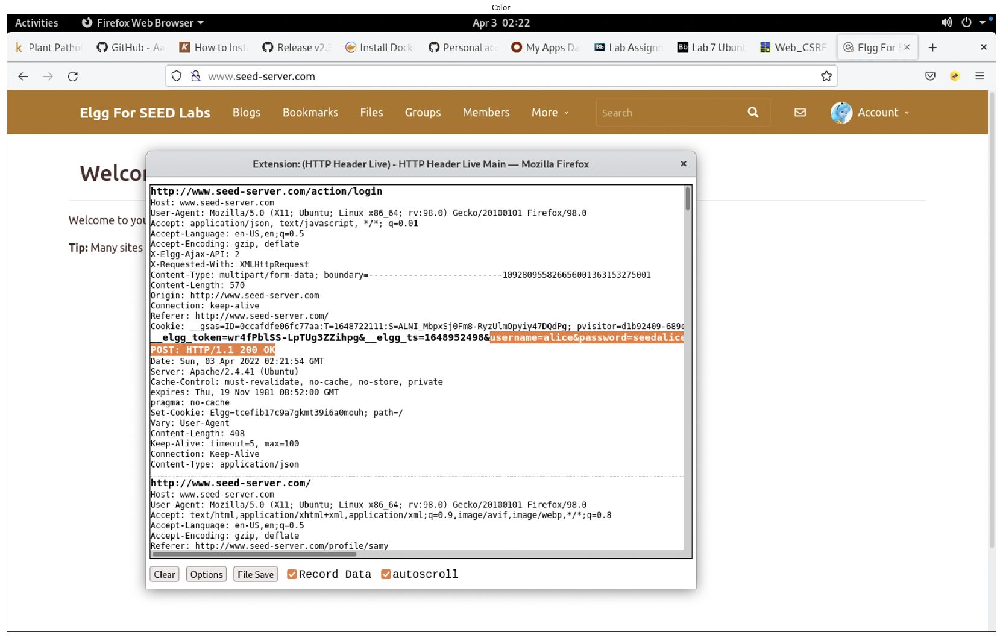

In [4]:
show_img('Task 1/post.png')

From POST request, the username=alice, password=seedalice, _elgg_token=wr4fPblSS-LpTUg3ZZihpg (token), __elgg_ts=1648952498 (timestamp) is retrieved

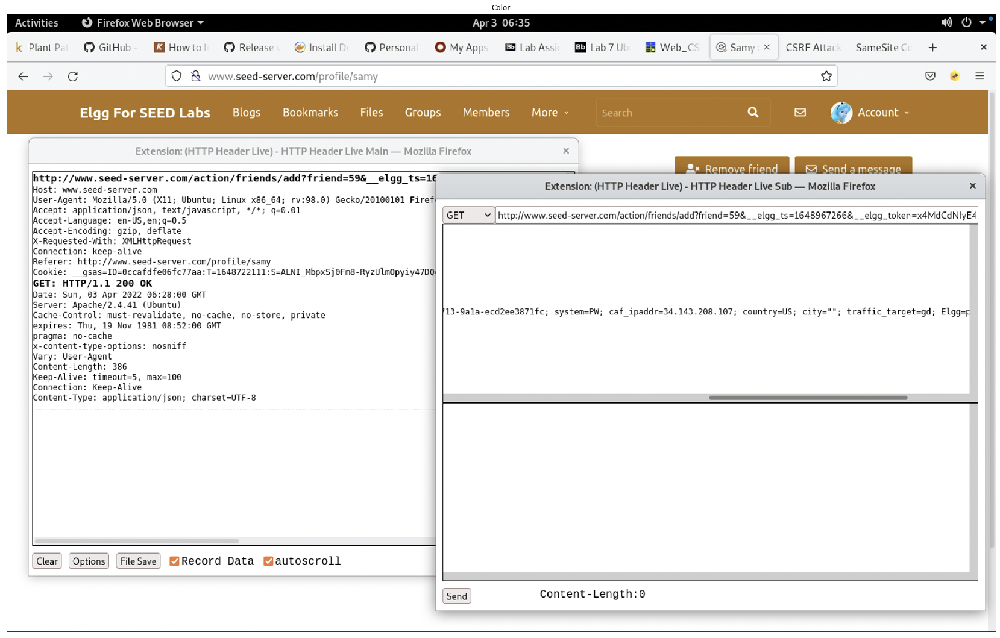

In [5]:
show_img('Task 1/get.png')

When GET request of adding Samy indicates that Samy's guid is 59, and it also has its own __elgg_ts and __elgg_token

# Task 2: CSRF Attack using GET Request

Samy is a very lonely hacker, and needs more friends, so as part of April Fool's joke, he decides to prank Alice to add him as a friend. His relationship with Alice is complicated, and as part of tricking Alice into adding him without knowing, he decided to reconstruct the web page and trick her into adding him.

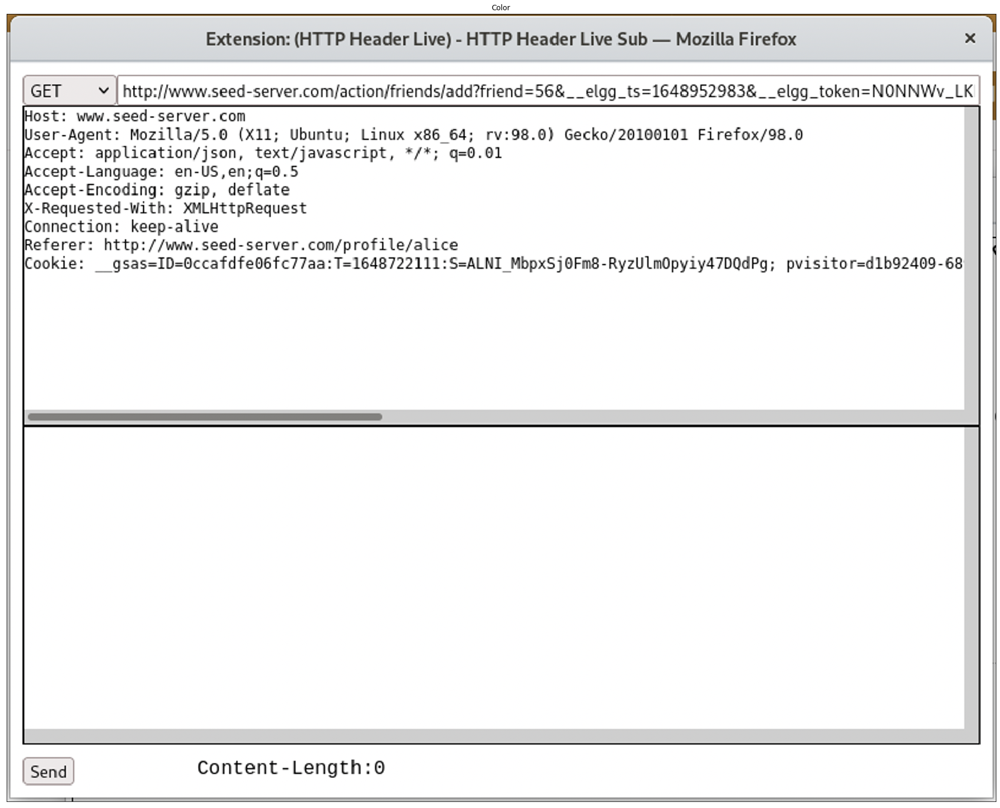

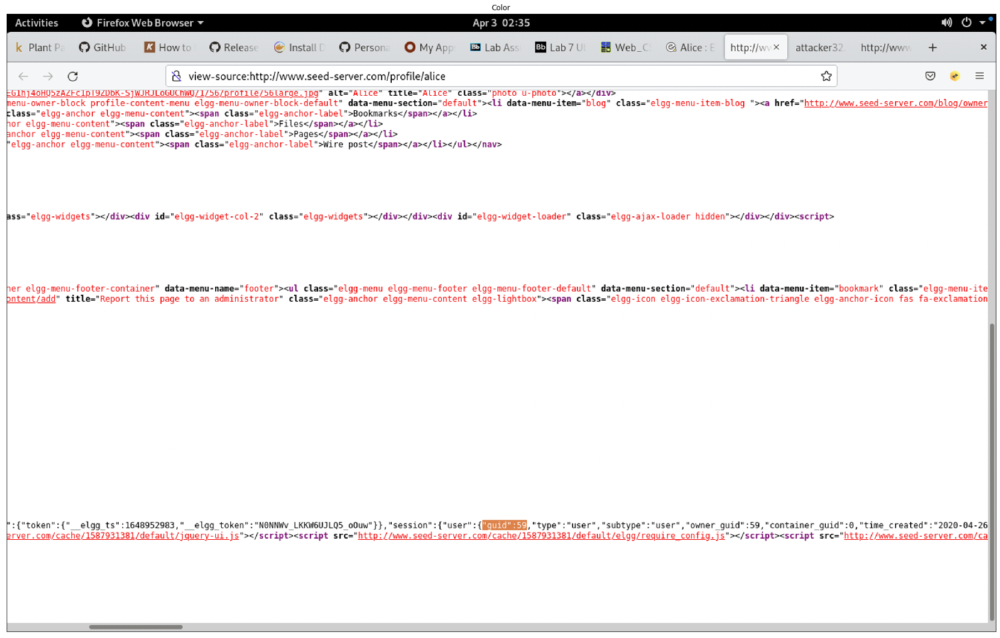

In [6]:
show_img('Task 2/guid_alice.png')
show_img('Task 2/guid_samy.png')

Samy snoops around and finds out Alice's guid: 56, and he knows his guid is 59. From the GET request, he changes the add?friend=59

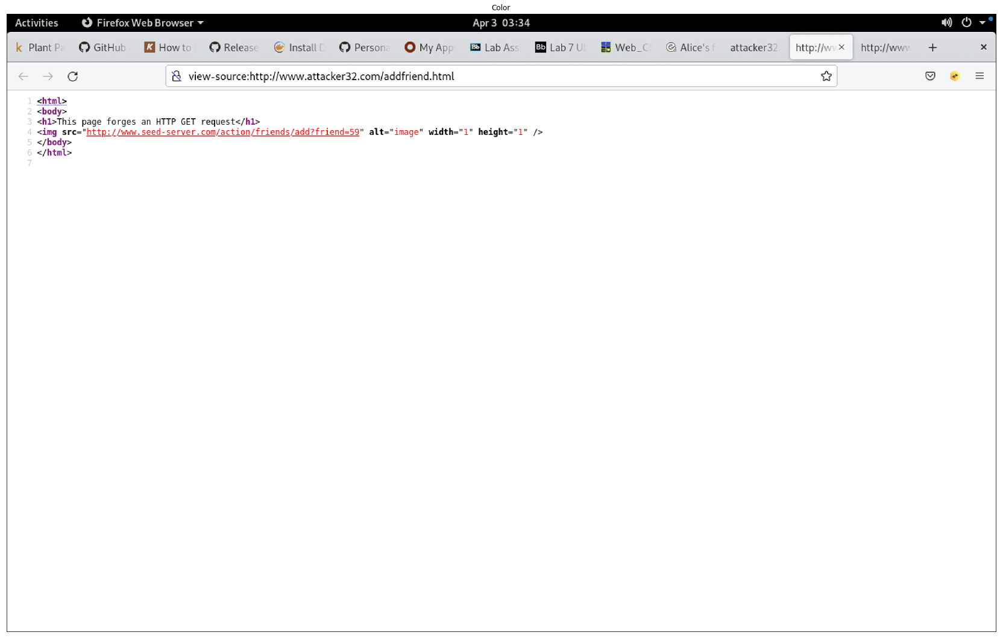

In [7]:
show_img('Task 2/attacker_source.png')

After verifying that he has created the link, Samy waits in anticipation, and after an hour, Alice accidentally adds Samy as a friend.

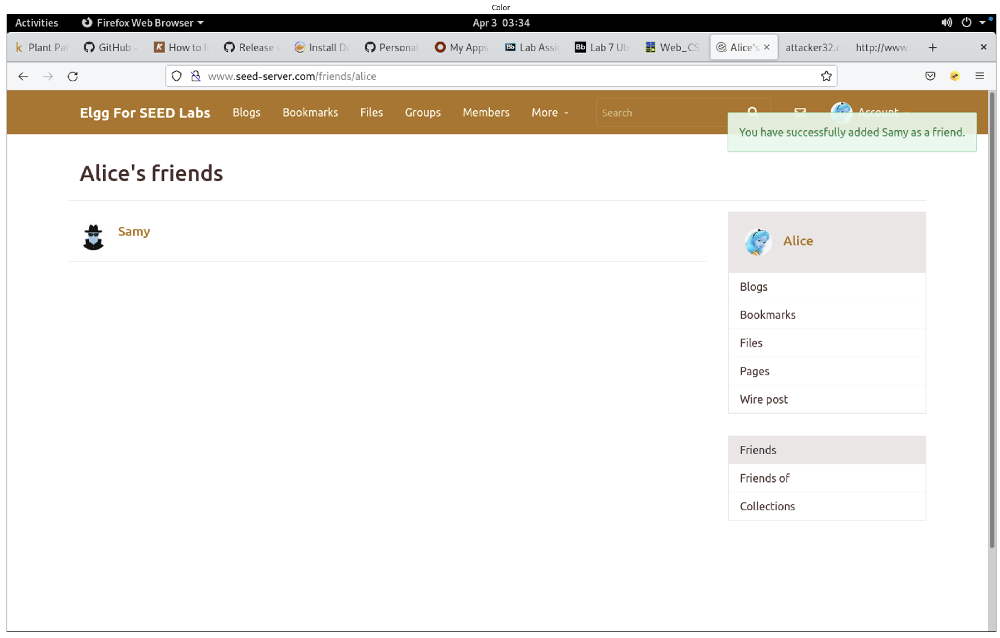

In [8]:
show_img('Task 2/alice_my_friend.png')

Voila, Alice is Samy's friend, but the thing is how long will she figure out that she added Samy as a friend unknowingly. And will she kick Samy out of her friendzone...

# Task 3: CSRF Attack using POST Request

After realizing she added Samy, Alice does not know when she added him as she remembered blocking Samy before. Samy the perpetrator is getting a bit worried, as he got no response from Alice. Samy decides to add a definitive strike to get Alice's attention. He wants Alice to know him as her hero.

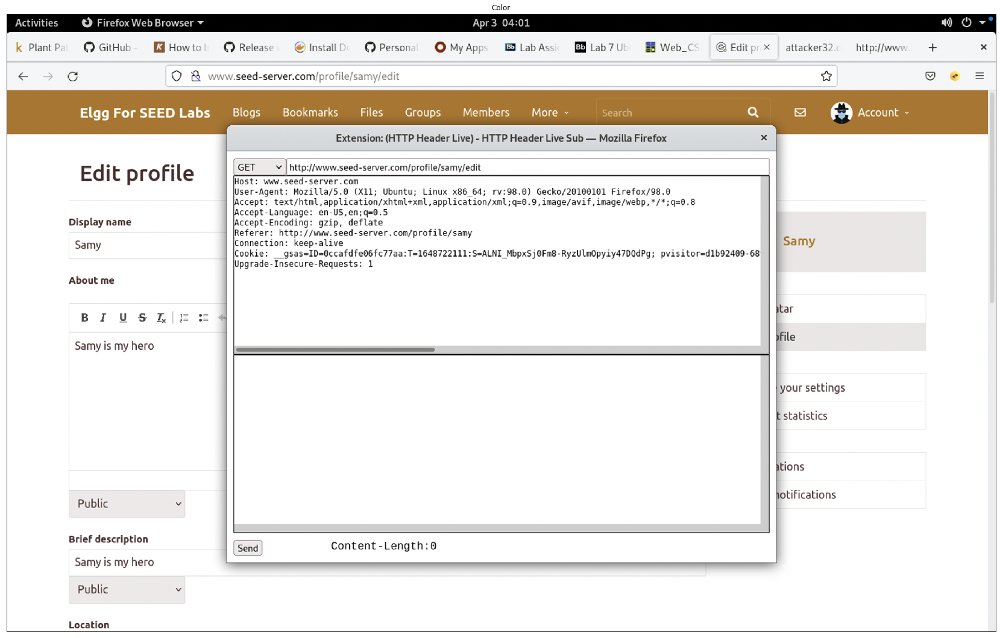

In [9]:
show_img('Task 3/edit_profile.png')

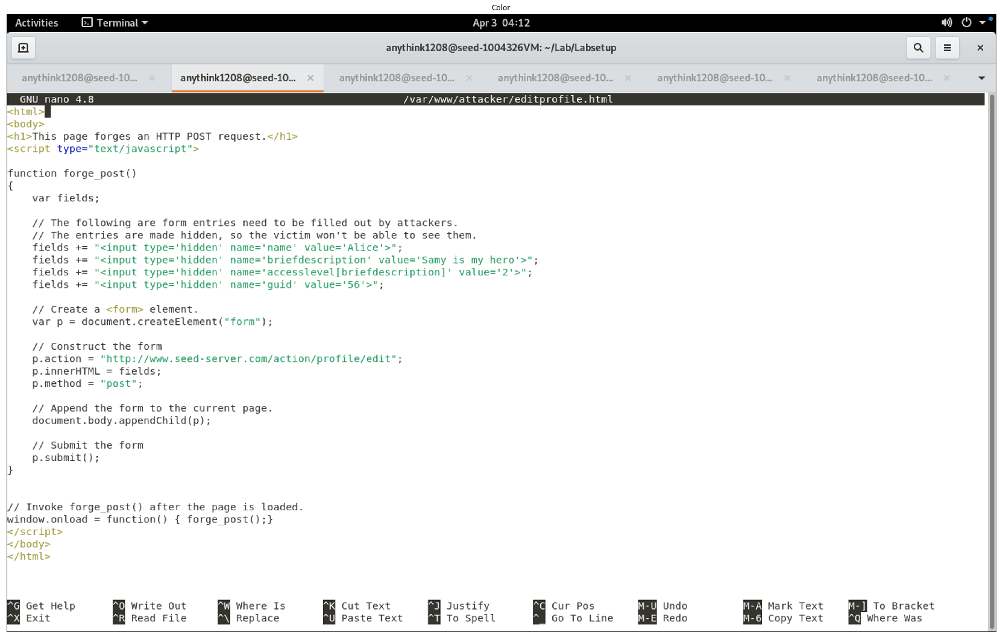

In [10]:
show_img('Task 3/forge_post.png')

Samy snoops around in his profile to gather the GET request. And with the information of the link, he forges a POST request with Alice's details, guid=56, and changes the brief description to 'Samy is my hero'.

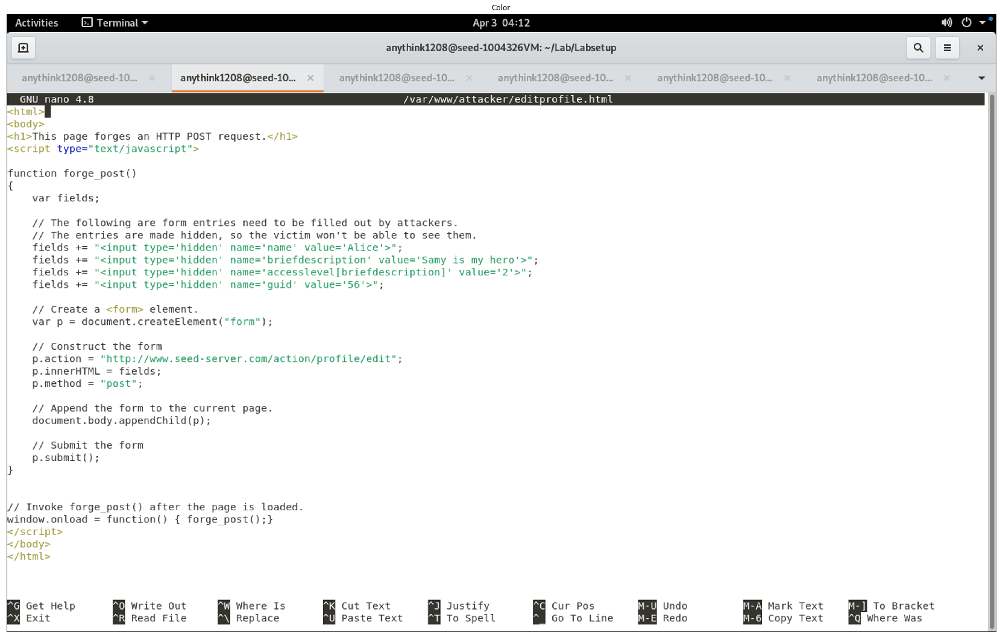

In [11]:
show_img('Task 3/forge_post.png')

After verifying that he has created the link, Samy waits in anticipation, and after an hour, Alice's profile page has a description 'Samy is my hero'.

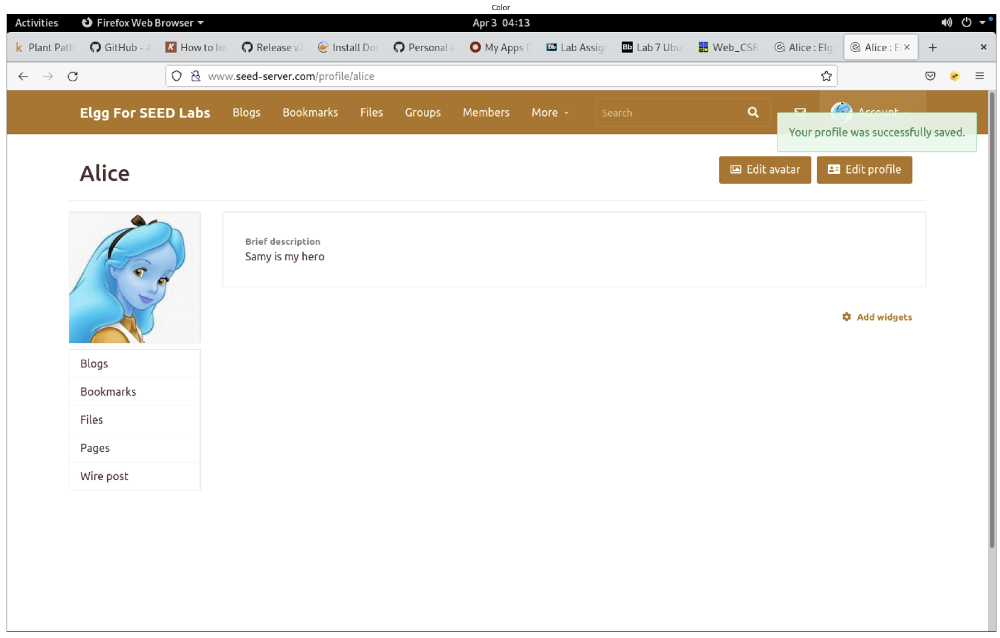

In [12]:
show_img('Task 3/samy_is_my_hero.png')

Alice found out the perpetrator, and till this day, we were wondering what exactly happened to Alice and Samy, did they end up together or did life go on separate ways...

**Question 1**: The forged HTTP request needs Alice’s user id (guid) to work properly. If Boby targets Alice specifically, before the attack, he can find ways to get Alice’s user id. Boby does not know Alice’s Elgg password, so he cannot log into Alice’s account to get the information. Please describe how Boby can solve this problem.

Boby can gather Alice's information from the web page source, Alice's guid (56) can be known by adding her as a friend, and observe using the HTTP Header Live tool or the page source 'page_owner' tag.

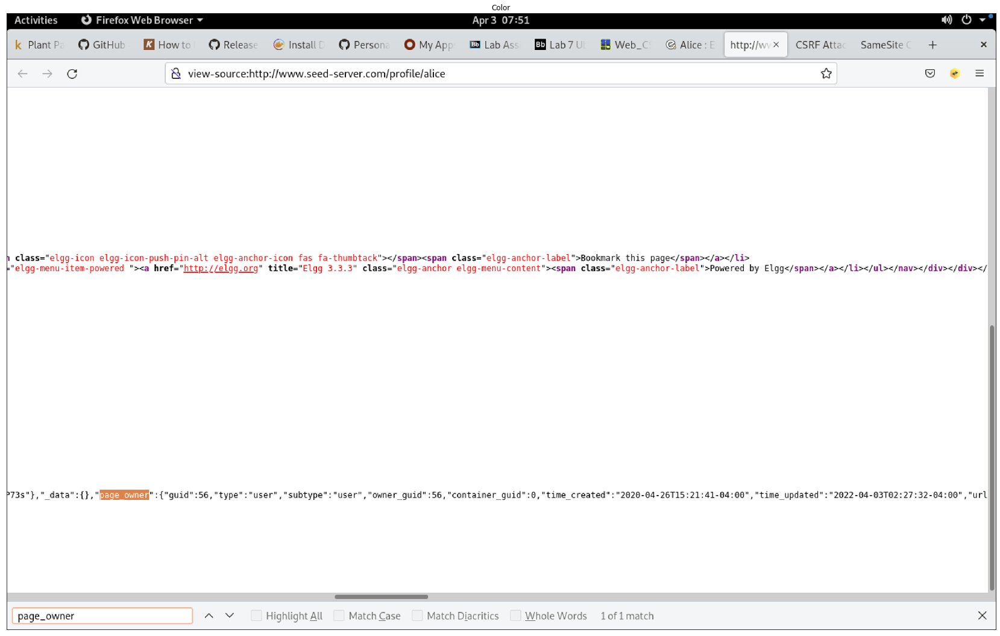

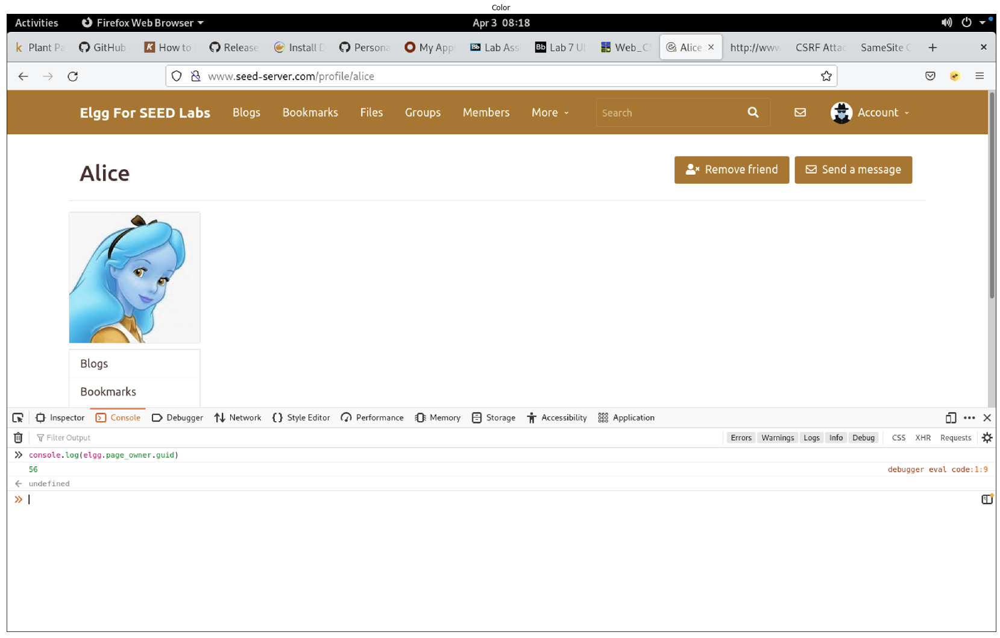

In [19]:
show_img('Task 3/page_owner_source.png')
show_img('Task 3/console_out.png')

**Question 2**: If Boby would like to launch the attack to anybody who visits his malicious web page. In this case, he does not know who is visiting the web page beforehand. Can he still launch the CSRF attack to modify the victim’s Elgg profile? Please explain.

No, he would not be able to do so since a CSRF attack would not allow the the attacker to dynamically access the victim's details (guid) as both the attacker and victims are of different origins. This would prevent the successful search of the guid which is necessary for the attack to be performed on the victim.

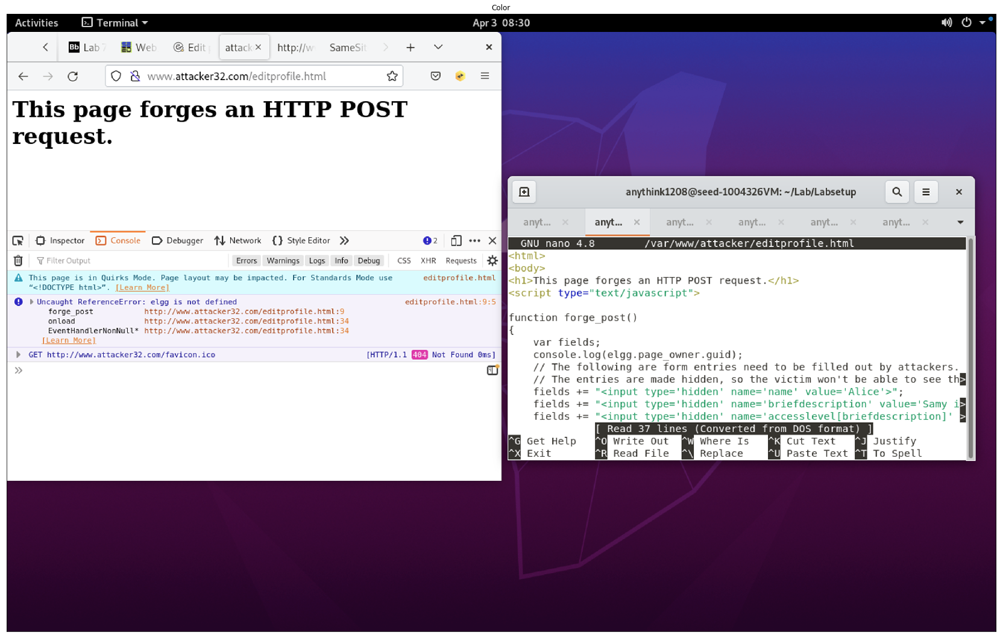

In [18]:
show_img('Task 3/elgg_not_def.png')

# Task 4: Enabling Elgg’s Countermeasure

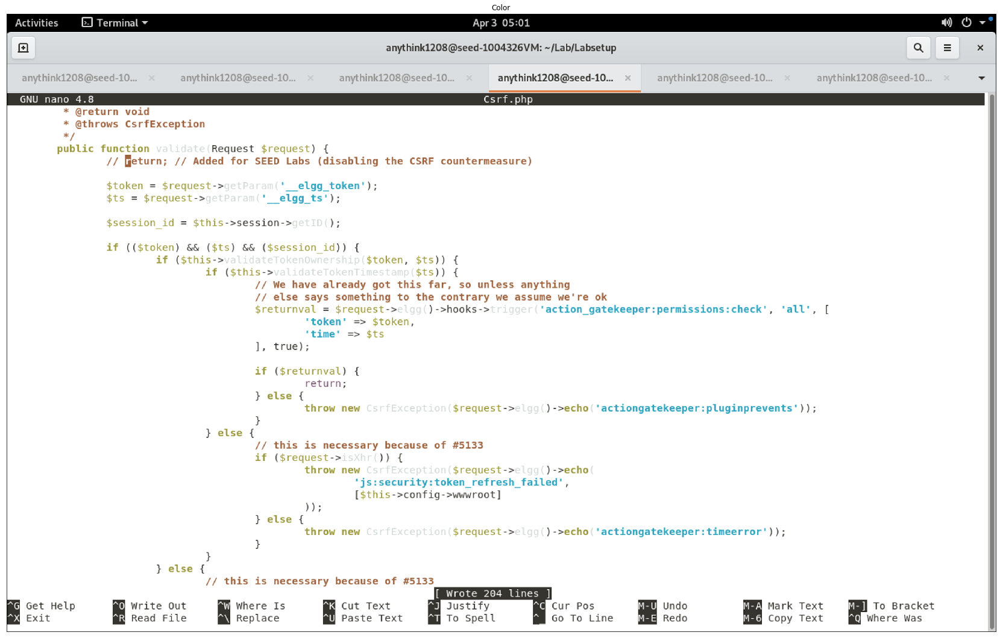

In [15]:
show_img('Task 4/unblock_validate.png')

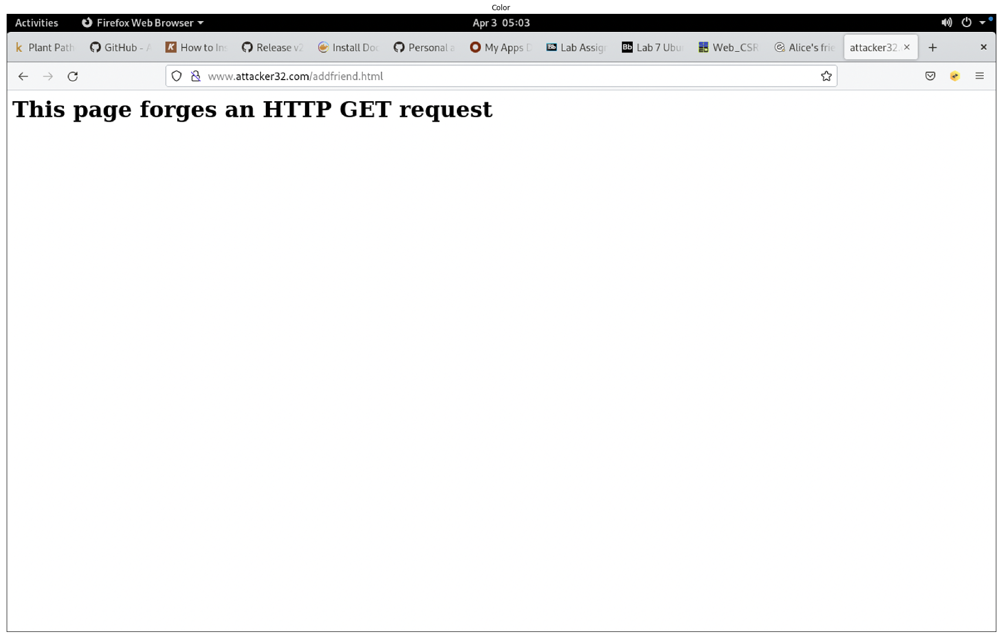

In [17]:
show_img('Task 4/stuck.png')

After commenting out the return statement, the web page does not react since the token and the ts field is unable to retrieved.

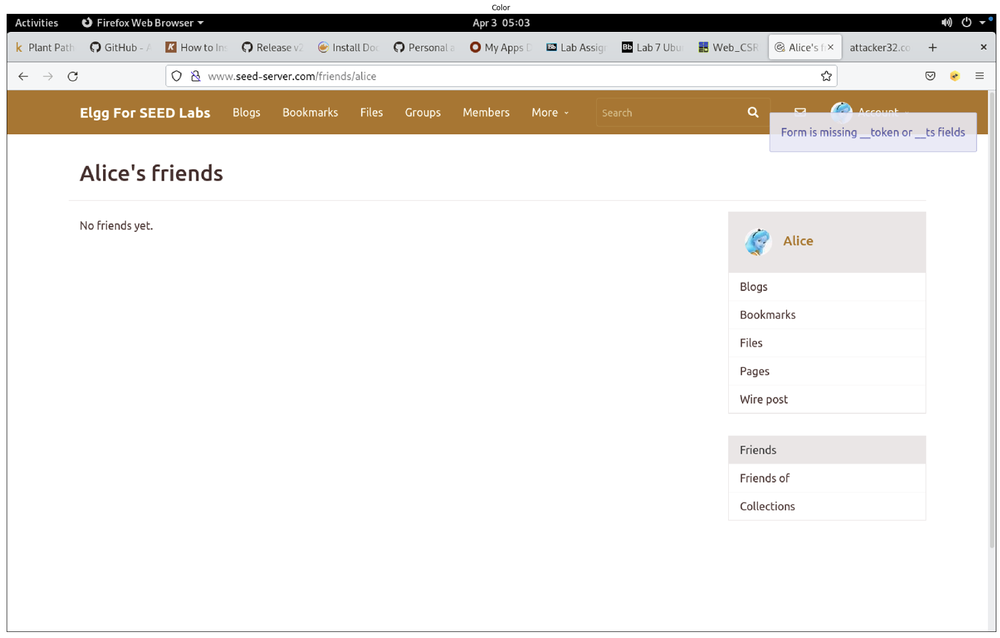

In [16]:
show_img('Task 4/missing_val.png')

The same can be said for the profile editing, but the reason boils down to the same origin policy (SOP) blocking entities of different origins from accessing the variables found in www.seed-server.com.

# Task 5: Experimenting with the SameSite Cookie Method

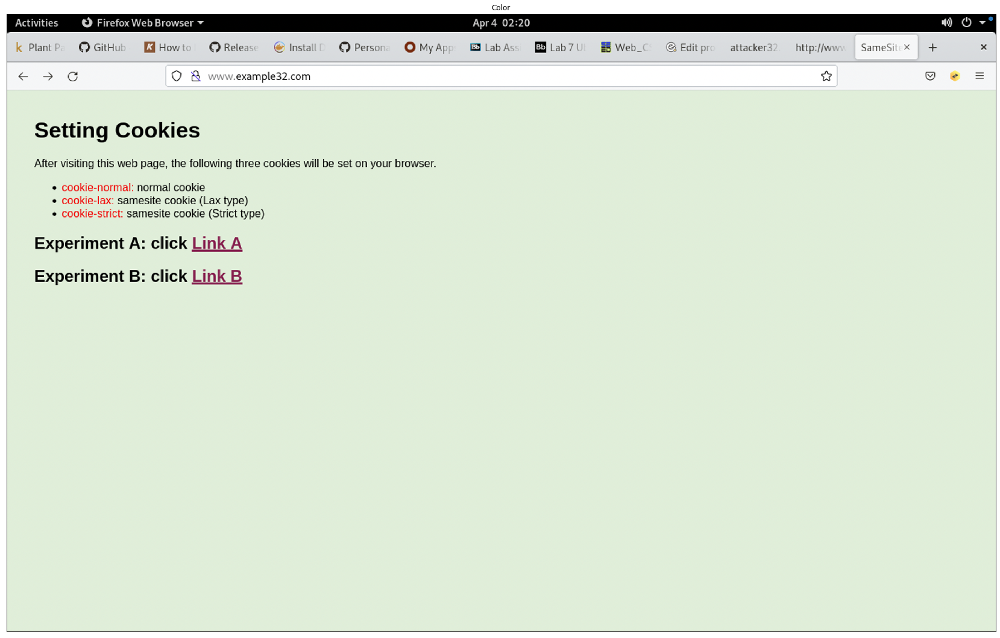

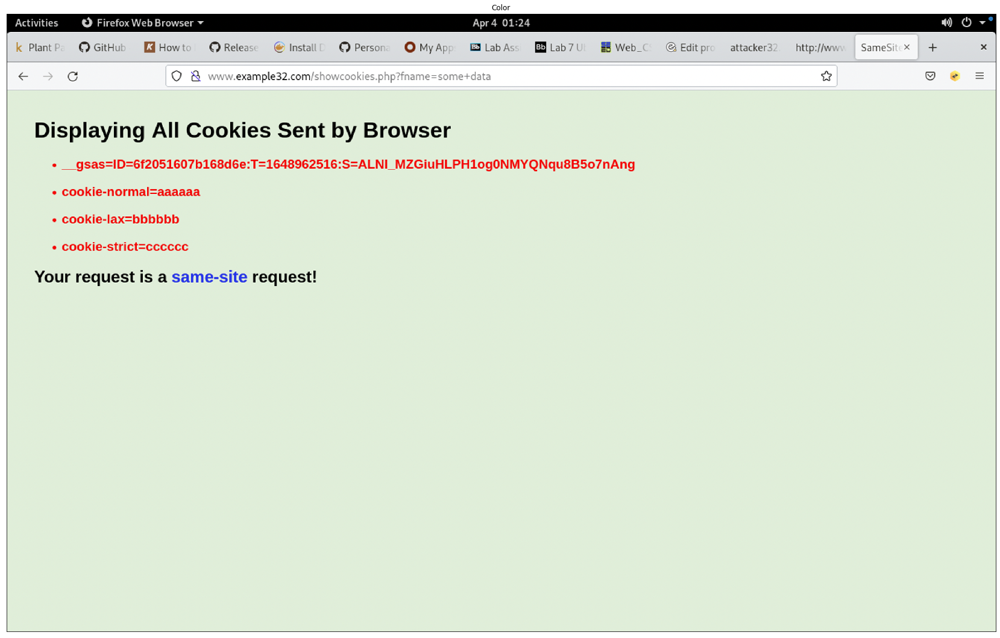

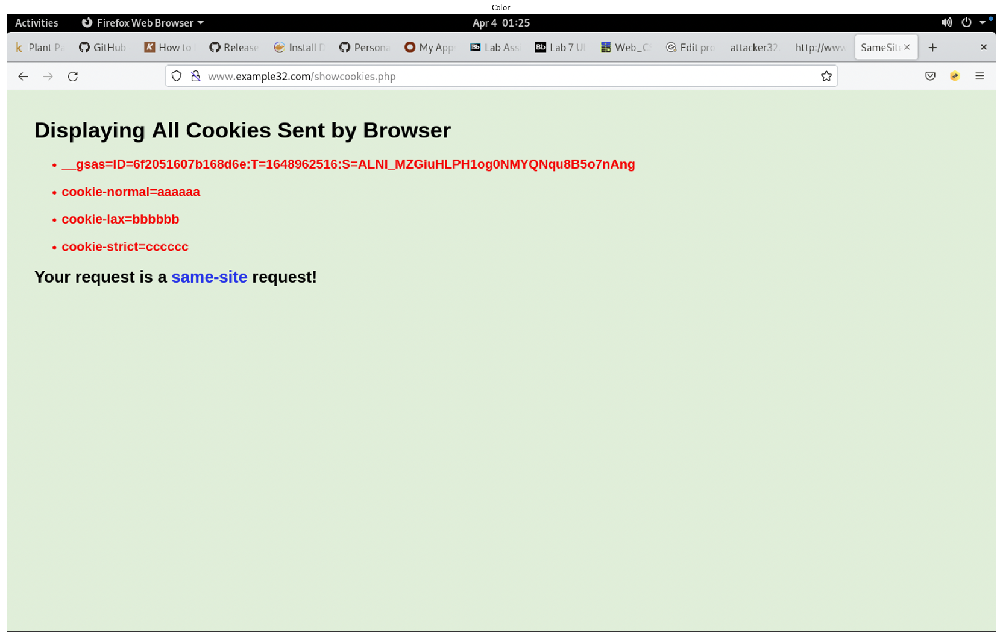

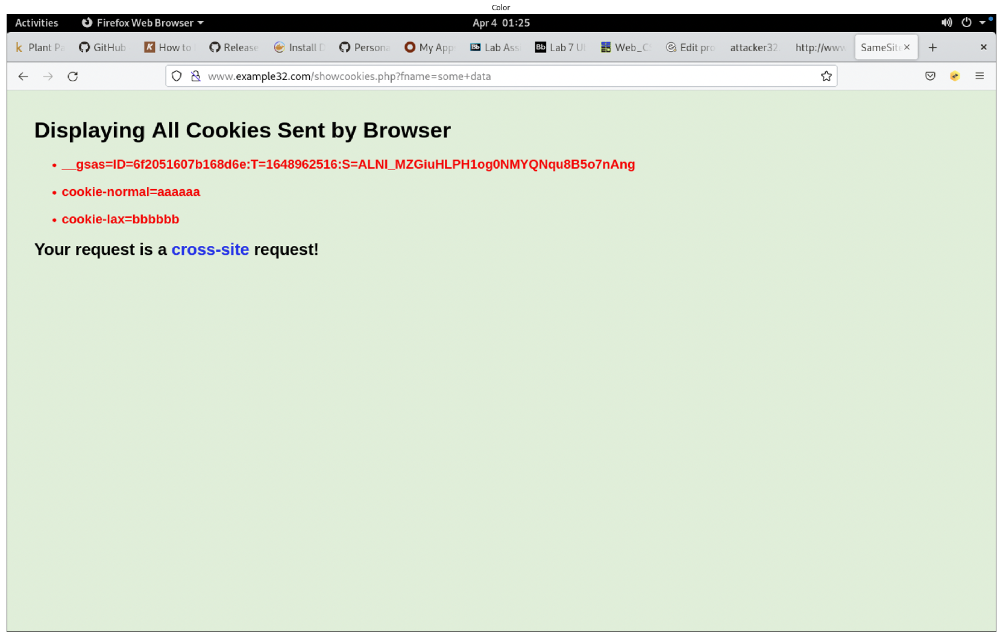

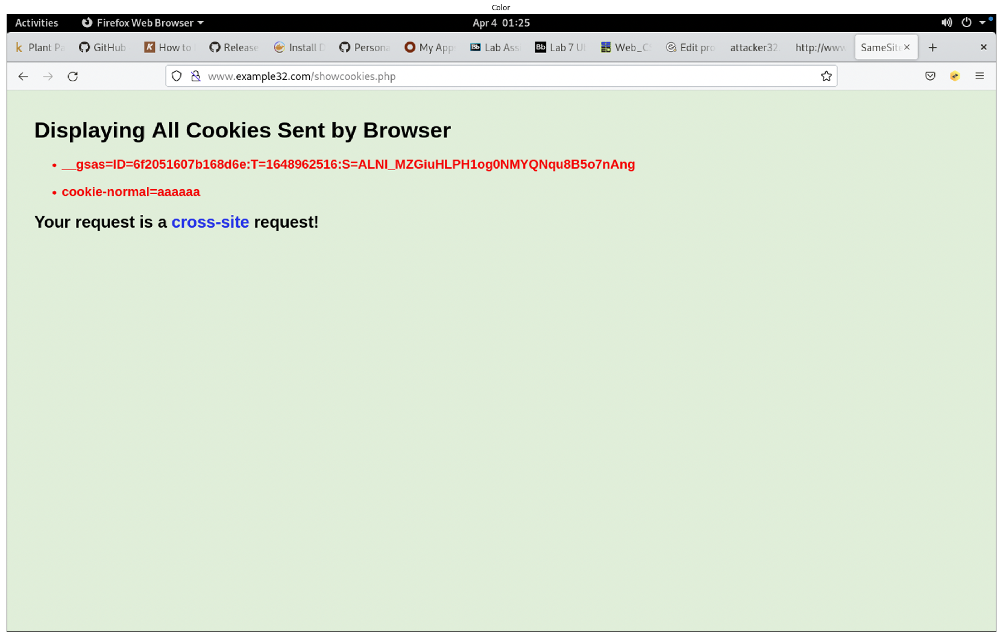

In [21]:
show_img('Task 5/config.png')
show_img('Task 5/same_site_get.png')
show_img('Task 5/same_site_post.png')
show_img('Task 5/cross_site_get.png')
show_img('Task 5/cross_site_post.png')

* Please describe what you see and explain why some cookies are not sent in certain scenarios.

In the case of a normal cookie, there is policy governing the access to the cookie, so it can be retrieved and updated by both same-site and cross-site request.

As part of the cookie-lax, we send the SameSite=Lax attribute when setting the Set-Cookie header, the browser does not send cookies with cross-site requests as long as the user is not navigating to the origin site. When navigating to other sites, the window.location.replace still causes the browser to send cookies with a GET request, but the browser does not send the cookies with POST requests made with ```<form>``` elements or when requesting images.

In the cookie-strict, the browser does not send the cookies when using window.location.replace. The same thing applies to anchor elements and GET requests we could send with the ```<form>``` element. Similarly to cookie-lax, browsers do not send cross-site requests from within iframes,

* Based on your understanding, please describe how the SameSite cookies can help a server detect whether a request is a cross-site or same-site request.

With SameSite cookies, the browser does not send cookies when using window.location.replace, specifically with cross-site requests as long as the user is not navigating to the origin site. This applies to anchor elements and GET requests we could send with the ```<form>``` element.

* Please describe how you would use the SameSite cookie mechanism to help Elgg defend against CSRF attacks. You only need to describe general ideas, and there is no need to implement them.

I will set JavaScript function for setting response header: ```response.setHeader('Set-Cookie', `Authentication=${token}; HttpOnly; SameSite=Lax; Secure`);```. These will allow the Elgg to detect if the request is cross-site or same-site, and prevent the browser from sending cookies with POST request.